# **EEE 511 : ARTIFICIAL NEURAL COMPUTATION**
# **Team 12**
# **Final Project Code**
# **HUMAN POSE ESTIMATION(DensePose)**

# **Pose Detection with DensePose**
This notebook uses an open source project facebookresearch/DensePose to detect multi person poses on a test image.

**Install DensePose**

First, we are going to install an Anaconda with some fixed dependencies.

(Runtime > Change Runtime Type > Hardware Accelerator : GPU)

In [ ]:
import os
from os.path import exists, join, basename, splitext

# install Anaconda Python 2.7 to control the dependencies
# see for more info: 
if not exists('anaconda2'):
  !wget -q https://repo.anaconda.com/archive/Anaconda2-2019.03-Linux-x86_64.sh
  !chmod +x Anaconda2-2019.03-Linux-x86_64.sh
  !bash ./Anaconda2-2019.03-Linux-x86_64.sh -b -f -p /content/anaconda2
  # set PATH environment variable
  os.environ['PATH'] = "/content/anaconda2/bin:" + os.environ['PATH']
  # install PyTorch
  !conda install -y pyyaml=3.12
  !conda install -y mkl-include
  !conda install -y pytorch=1.0.1 torchvision cudatoolkit=10.0 -c pytorch
  !ln -s /content/anaconda2/lib/python2.7/site-packages/torch/lib/ /content/anaconda2/lib/python2.7/site-packages/
  # install GCC 4.9
  !conda install -y -c serge-sans-paille gcc_49
  !ln -fs /content/anaconda2/lib/libmpfr.so /content/anaconda2/lib/libmpfr.so.4
  os.environ['CC'] = '/content/anaconda2/bin/gcc-4.9'
  os.environ['CXX'] = '/content/anaconda2/bin/g++-4.9'
  # protobuf 3.5
  #!apt-get -qq remove -y protobuf-compiler
  !conda install -y protobuf=3.5
  # pycocotools
  !conda install -y -c conda-forge pycocotools
  
# we need some headers from the pytorch source
if not exists('pytorch'):
  !git clone -q --depth 1 --recursive -b v1.0.1 https://github.com/pytorch/pytorch

PREFIX=/content/anaconda2
installing: python-2.7.16-h9bab390_0 ...
using -f (force) option
Python 2.7.16 :: Anaconda, Inc.
installing: conda-env-2.6.0-1 ...
using -f (force) option
installing: blas-1.0-mkl ...
using -f (force) option
installing: ca-certificates-2019.1.23-0 ...
using -f (force) option
installing: intel-openmp-2019.3-199 ...
using -f (force) option
installing: libgcc-ng-8.2.0-hdf63c60_1 ...
using -f (force) option
installing: libgfortran-ng-7.3.0-hdf63c60_0 ...
using -f (force) option
installing: libstdcxx-ng-8.2.0-hdf63c60_1 ...
using -f (force) option
installing: bzip2-1.0.6-h14c3975_5 ...
using -f (force) option
installing: expat-2.2.6-he6710b0_0 ...
using -f (force) option
installing: fribidi-1.0.5-h7b6447c_0 ...
using -f (force) option
installing: gmp-6.1.2-h6c8ec71_1 ...
using -f (force) option
installing: graphite2-1.3.13-h23475e2_0 ...
using -f (force) option
installing: icu-58.2-h9c2bf20_1 ...
using -f (force) option
installing: jbig-2.1-hdba287a_0 ...
using -f 

Check whether the system dependencies are installed correctly:

In [ ]:
# some sanity checks
!conda --version
!protoc --version
!gcc-4.9 --version

conda 4.7.12
libprotoc 3.5.1
gcc-4.9 (GCC) 4.9.1
Copyright (C) 2014 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



Clone the DensePose project and build it:

In [ ]:
import os
from os.path import exists, join, basename, splitext

git_repo_url = 'https://github.com/facebookresearch/DensePose.git'
project_name = splitext(basename(git_repo_url))[0]
if not exists(project_name):
  # clone project
  !git clone -q --depth 1 $git_repo_url
  # install dependencies
  !cd $project_name && pip install -q -r requirements.txt
  # update CMakeLists.txt
  cmakelists_txt_content = """
cmake_minimum_required(VERSION 2.8.12 FATAL_ERROR)
set(Caffe2_DIR "/content/anaconda2/lib/python2.7/site-packages/torch/share/cmake/Caffe2/")
find_package(Caffe2 REQUIRED)

include_directories("/content/anaconda2/lib/python2.7/site-packages/torch/lib/include")
include_directories("/content/anaconda2/include")
include_directories("/content/pytorch")

add_library(libprotobuf STATIC IMPORTED)
set(PROTOBUF_LIB "/content/anaconda2/lib/libprotobuf.a")
set_property(TARGET libprotobuf PROPERTY IMPORTED_LOCATION "${PROTOBUF_LIB}")

if (${CAFFE2_VERSION} VERSION_LESS 0.8.2)
  # Pre-0.8.2 caffe2 does not have proper interface libraries set up, so we
  # will rely on the old path.
  message(WARNING
      "You are using an older version of Caffe2 (version " ${CAFFE2_VERSION}
      "). Please consider moving to a newer version.")
  include(cmake/legacy/legacymake.cmake)
  return()
endif()

# Add compiler flags.
set(CMAKE_C_FLAGS "${CMAKE_C_FLAGS} -std=c11")
set(CMAKE_CXX_FLAGS "${CMAKE_CXX_FLAGS} -std=c++11 -O2 -fPIC -Wno-narrowing")

# Print configuration summary.
include(cmake/Summary.cmake)
detectron_print_config_summary()

# Collect custom ops sources.
file(GLOB CUSTOM_OPS_CPU_SRCS ${CMAKE_CURRENT_SOURCE_DIR}/detectron/ops/*.cc)
file(GLOB CUSTOM_OPS_GPU_SRCS ${CMAKE_CURRENT_SOURCE_DIR}/detectron/ops/*.cu)

# Install custom CPU ops lib.
add_library(
     caffe2_detectron_custom_ops SHARED
     ${CUSTOM_OPS_CPU_SRCS})

target_link_libraries(caffe2_detectron_custom_ops caffe2_library libprotobuf)
install(TARGETS caffe2_detectron_custom_ops DESTINATION lib)

# Install custom GPU ops lib, if gpu is present.
if (CAFFE2_USE_CUDA OR CAFFE2_FOUND_CUDA)
  # Additional -I prefix is required for CMake versions before commit (< 3.7):
  # https://github.com/Kitware/CMake/commit/7ded655f7ba82ea72a82d0555449f2df5ef38594
  list(APPEND CUDA_INCLUDE_DIRS -I${CAFFE2_INCLUDE_DIRS})
  CUDA_ADD_LIBRARY(
      caffe2_detectron_custom_ops_gpu SHARED
      ${CUSTOM_OPS_CPU_SRCS}
      ${CUSTOM_OPS_GPU_SRCS})

  target_link_libraries(caffe2_detectron_custom_ops_gpu caffe2_gpu_library libprotobuf)
  install(TARGETS caffe2_detectron_custom_ops_gpu DESTINATION lib)
endif()"""
  open(join(project_name, 'CMakeLists.txt'), 'w').write(cmakelists_txt_content)
  # build
  !cd $project_name && make
  !cd $project_name && make ops
  # download dense pose data
  !cd $project_name/DensePoseData && bash get_densepose_uv.sh

    100% |████████████████████████████████| 28.7MB 1.2MB/s 
    100% |████████████████████████████████| 40kB 19.6MB/s 
python2 setup.py develop --user
Compiling detectron/utils/cython_bbox.pyx because it changed.
Compiling detectron/utils/cython_nms.pyx because it changed.
[1/2] Cythonizing detectron/utils/cython_bbox.pyx
/content/anaconda2/lib/python2.7/site-packages/Cython/Compiler/Main.py:367: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /content/DensePose/detectron/utils/cython_bbox.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
[2/2] Cythonizing detectron/utils/cython_nms.pyx
/content/anaconda2/lib/python2.7/site-packages/Cython/Compiler/Main.py:367: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /content/DensePose/detectron/utils/cython_nms.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
running develop
runnin

Check whether the DensePose installation was successful:

In [ ]:
!python2 $project_name/detectron/tests/test_spatial_narrow_as_op.py
!python2 $project_name/detectron/tests/test_zero_even_op.py

No handlers could be found for logger "caffe2.python.net_drawer"
net_drawer will not run correctly. Please install the correct dependencies.
[E init_intrinsics_check.cc:43] CPU feature avx is present on your machine, but the Caffe2 binary is not compiled with it. It means you may not get the full speed of your CPU.
[E init_intrinsics_check.cc:43] CPU feature avx2 is present on your machine, but the Caffe2 binary is not compiled with it. It means you may not get the full speed of your CPU.
[E init_intrinsics_check.cc:43] CPU feature fma is present on your machine, but the Caffe2 binary is not compiled with it. It means you may not get the full speed of your CPU.
Found Detectron ops lib: /content/anaconda2/lib/python2.7/site-packages/lib/libcaffe2_detectron_ops_gpu.so
...
----------------------------------------------------------------------
Ran 3 tests in 4.063s

OK
[E init_intrinsics_check.cc:43] CPU feature avx is present on your machine, but the Caffe2 binary is not compiled with it.

# **Detect poses on a test image from COCO Dataset**

Detect poses on the test image, 'demo_im.jpg', from the COCO dataset which is included in the DensePose repo:

In [ ]:
!cd $project_name && python2 tools/infer_simple.py \
    --cfg configs/DensePose_ResNet101_FPN_s1x-e2e.yaml \
    --output-dir DensePoseData/infer_out/ \
    --image-ext jpg \
    --wts https://dl.fbaipublicfiles.com/densepose/DensePose_ResNet101_FPN_s1x-e2e.pkl \
    DensePoseData/demo_data/demo_im.jpg

Found Detectron ops lib: /content/anaconda2/lib/python2.7/site-packages/lib/libcaffe2_detectron_ops_gpu.so
[E init_intrinsics_check.cc:43] CPU feature avx is present on your machine, but the Caffe2 binary is not compiled with it. It means you may not get the full speed of your CPU.
[E init_intrinsics_check.cc:43] CPU feature avx2 is present on your machine, but the Caffe2 binary is not compiled with it. It means you may not get the full speed of your CPU.
[E init_intrinsics_check.cc:43] CPU feature fma is present on your machine, but the Caffe2 binary is not compiled with it. It means you may not get the full speed of your CPU.
INFO io.py:  57: Downloading remote file https://dl.fbaipublicfiles.com/densepose/DensePose_ResNet101_FPN_s1x-e2e.pkl to /tmp/detectron-download-cache/DensePose_ResNet101_FPN_s1x-e2e.pkl
  [============================================================] 100.0% of 607.9MB file  
WARNING cnn.py:  25: [====DEPRECATE WARNING====]: you are creating an object from CNNMo

Displaying the test image

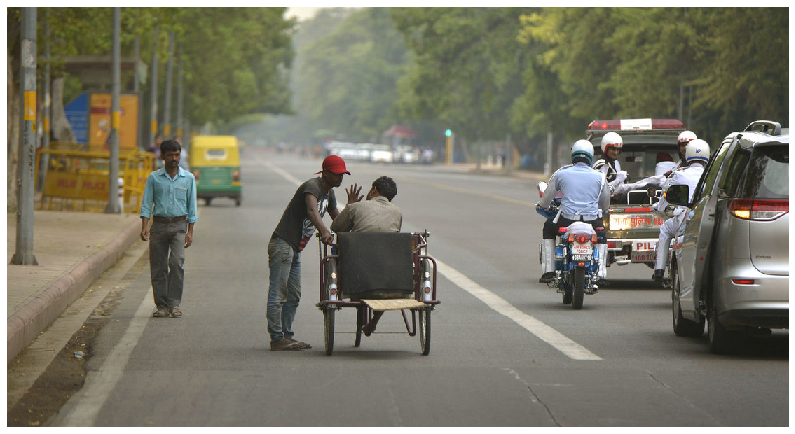

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

im  = cv2.imread(join(project_name, 'DensePoseData/demo_data/demo_im.jpg'))
plt.figure(figsize= [14,14])
plt.imshow(im[:,:,::-1]); plt.axis('off');
plt.show()

**Visualizing the result**

Visualize the isocontours of the UV fields:

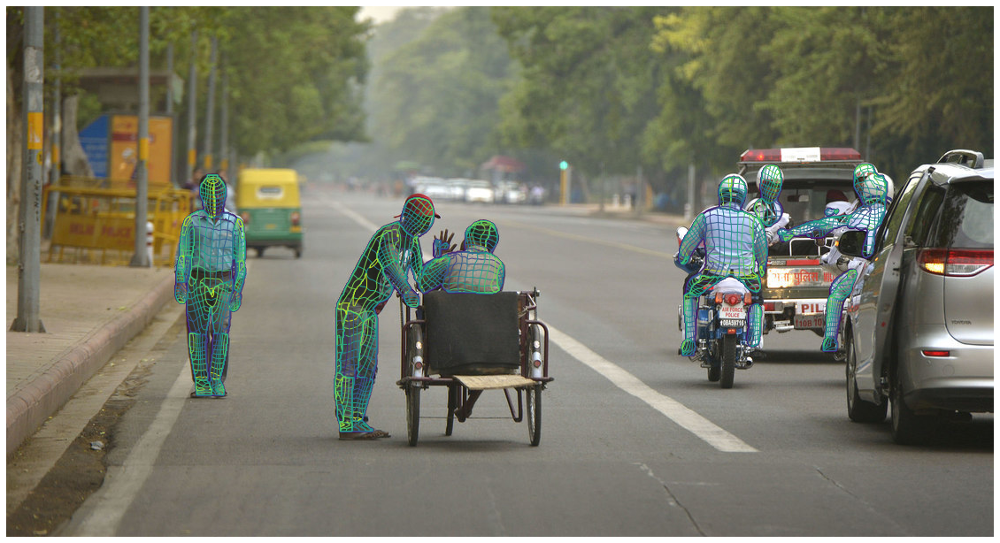

In [ ]:
IUV = cv2.imread(join(project_name, 'DensePoseData/infer_out/demo_im_IUV.png'))
INDS = cv2.imread(join(project_name, 'DensePoseData/infer_out/demo_im_INDS.png'),  0)

fig = plt.figure(figsize=[20, 20])
plt.imshow( im[:,:,::-1] )
plt.contour( IUV[:,:,1]/256.,10, linewidths = 1 )
plt.contour( IUV[:,:,2]/256.,10, linewidths = 1 )
plt.axis('off') ; plt.show()

Visualize the human-body FG mask indices:

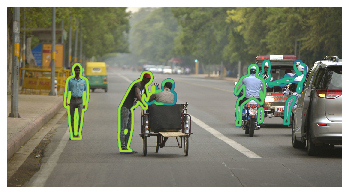

In [ ]:
plt.imshow( im[:,:,::-1] )
plt.contour( INDS, linewidths = 2 )
plt.axis('off') ; plt.show()

# **Texture Transfer Using Estimated Dense Coordinates**

In this notebook we demonstrate how the estimated dense coordinates can be used to map a texture from the UV space to image pixels. For this purpose we provide an "atlas" texture space, which allows easy design of custom textures. We also provide a modified texture that is obtained from the SURREAL dataset, which allows replication of the qualitative results that we provide in the paper.

Let's first visualize the UV atlas space with examplar textures:

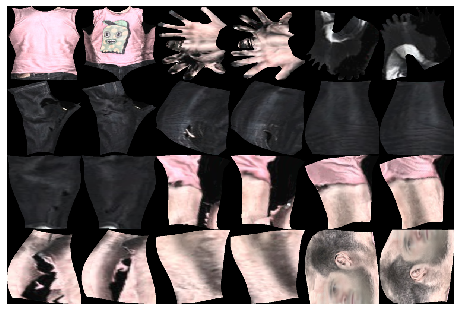

In [ ]:
import numpy
import cv2
import matplotlib.pyplot as plt
import numpy as np
#
fig = plt.figure(figsize=[8,8])
Tex_Atlas = cv2.imread(join(project_name,'DensePoseData/demo_data/texture_from_SURREAL.png'))[:,:,::-1]/255.
plt.imshow(Tex_Atlas.transpose([1,0,2]));plt.axis('off'); plt.show()
#
TextureIm  = np.zeros([24,200,200,3]);
#
for i in range(4):
    for j in range(6):
        TextureIm[(6*i+j) , :,:,:] = Tex_Atlas[ (200*j):(200*j+200)  , (200*i):(200*i+200) ,: ]

The texture above is obtained from the textures provided in the SURREAL dataset.

One can basically design their own textures on the provided texture images. We provide the white surface and black edges as the texture atlas guide, which is visualized below.

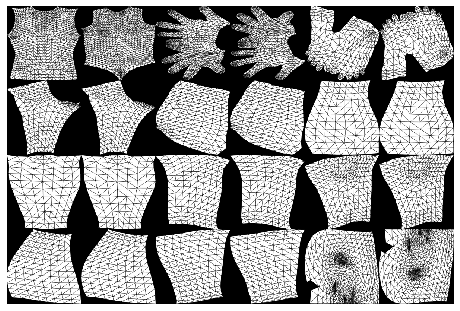

In [ ]:
fig = plt.figure(figsize=[8,8])
Tex_Atlas = cv2.imread(join(project_name,'DensePoseData/demo_data/texture_atlas_200.png'))[:,:,::-1]
plt.imshow(Tex_Atlas.transpose([1,0,2]));plt.axis('off'); plt.show()

Herein, we define the function to transfer the texture to the image domain.

In [ ]:
def TransferTexture(TextureIm,im,IUV):
    U = IUV[:,:,1]
    V = IUV[:,:,2]
    #
    R_im = np.zeros(U.shape)
    G_im = np.zeros(U.shape)
    B_im = np.zeros(U.shape)
    ###

    for PartInd in range(1,25):    ## Set to xrange(1,23) to ignore the face part.
        tex = TextureIm[PartInd-1,:,:,:].squeeze() # get texture for each part.
        #####
        R = tex[:,:,0]
        G = tex[:,:,1]
        B = tex[:,:,2]
        ###############
        x,y = np.where(IUV[:,:,0]==PartInd)
        u_current_points = U[x,y]   #  Pixels that belong to this specific part.
        v_current_points = V[x,y]
        ##
        r_current_points = R[((255-v_current_points)*199./255.).astype(int),(u_current_points*199./255.).astype(int)]*255
        g_current_points = G[((255-v_current_points)*199./255.).astype(int),(u_current_points*199./255.).astype(int)]*255
        b_current_points = B[((255-v_current_points)*199./255.).astype(int),(u_current_points*199./255.).astype(int)]*255
        ##  Get the RGB values from the texture images.
        R_im[IUV[:,:,0]==PartInd] = r_current_points
        G_im[IUV[:,:,0]==PartInd] = g_current_points
        B_im[IUV[:,:,0]==PartInd] = b_current_points
    generated_image = np.concatenate((B_im[:,:,np.newaxis],G_im[:,:,np.newaxis],R_im[:,:,np.newaxis]), axis =2 ).astype(np.uint8)
    BG_MASK = generated_image==0
    generated_image[BG_MASK] = im[BG_MASK]  ## Set the BG as the old image.
    return generated_image

Let's read an IUV file obtained by rendering the SMPL model and transfer the texture.

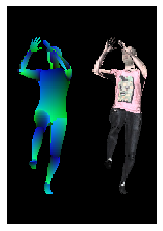

In [ ]:
IUV = cv2.imread(join(project_name,'DensePoseData/demo_data/synth_UV_example.png'))
im  = np.zeros(IUV.shape)
##
image = TransferTexture(TextureIm,im,IUV)
##
plt.imshow( np.hstack((IUV,image[:,:,::-1]))); plt.axis('off'); plt.show()

Vizualize the results of Texture Transfer:

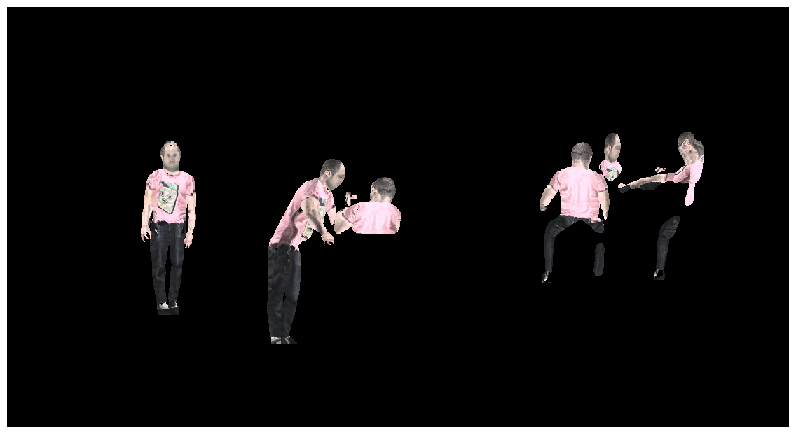

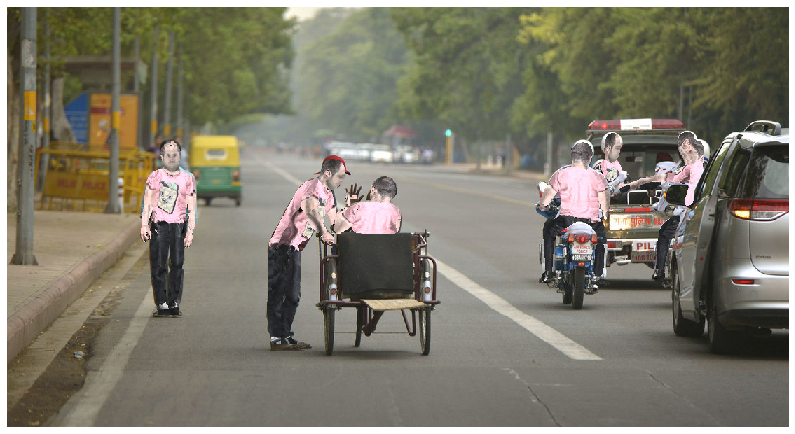

In [ ]:
IUV = cv2.imread(join(project_name,'DensePoseData/infer_out/demo_im_IUV.png'))
im  = cv2.imread(join(project_name,'DensePoseData/demo_data/demo_im.jpg'))
#######
## Visualize the image with black background
image = TransferTexture(TextureIm,np.zeros(IUV.shape),IUV)
fig = plt.figure(figsize=[14,14])
plt.imshow(image[:,:,::-1]); plt.axis('off'); plt.show()
#######
## Visualize the image with the image as the background.
image = TransferTexture(TextureIm,im,IUV)
fig = plt.figure(figsize=[14,14])
plt.imshow(image[:,:,::-1]); plt.axis('off'); plt.show()

# **Detecting poses on our test image**

Detect poses on the test image, 'testimage.jpeg', which is included in the DensePose repository

(Upload the file 'testimage.jpeg' into the folder DensePoseData/demo_data)

In [ ]:
!cd $project_name && python2 tools/infer_simple.py \
    --cfg configs/DensePose_ResNet101_FPN_s1x-e2e.yaml \
    --output-dir DensePoseData/infer_out/ \
    --image-ext jpg \
    --wts https://dl.fbaipublicfiles.com/densepose/DensePose_ResNet101_FPN_s1x-e2e.pkl \
    DensePoseData/demo_data/testimage.jpeg

Found Detectron ops lib: /content/anaconda2/lib/python2.7/site-packages/lib/libcaffe2_detectron_ops_gpu.so
[E init_intrinsics_check.cc:43] CPU feature avx is present on your machine, but the Caffe2 binary is not compiled with it. It means you may not get the full speed of your CPU.
[E init_intrinsics_check.cc:43] CPU feature avx2 is present on your machine, but the Caffe2 binary is not compiled with it. It means you may not get the full speed of your CPU.
[E init_intrinsics_check.cc:43] CPU feature fma is present on your machine, but the Caffe2 binary is not compiled with it. It means you may not get the full speed of your CPU.
WARNING cnn.py:  25: [====DEPRECATE WARNING====]: you are creating an object from CNNModelHelper class which will be deprecated soon. Please use ModelHelper object with brew module. For more information, please refer to caffe2.ai and python/brew.py, python/brew_test.py for more information.
INFO net.py:  51: Loading weights from: /tmp/detectron-download-cache/De

Displaying our test image

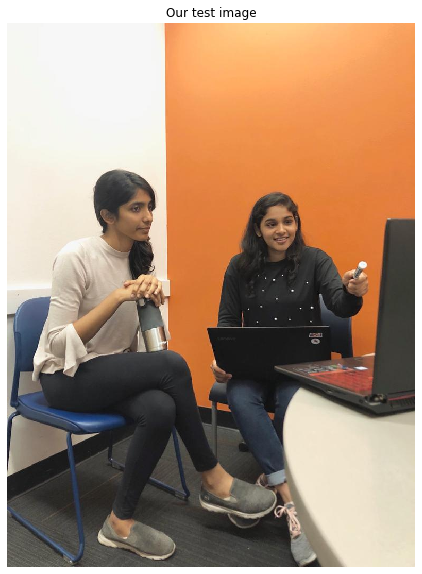

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

im  = cv2.imread(join(project_name, 'DensePoseData/demo_data/testimage.jpeg'))
plt.figure(figsize= [10,10])
plt.imshow(im[:,:,::-1]); plt.axis('off');
plt.title('Our test image')
plt.show()

**Visualizing the result**

Visualize the isocontours of the UV fields:

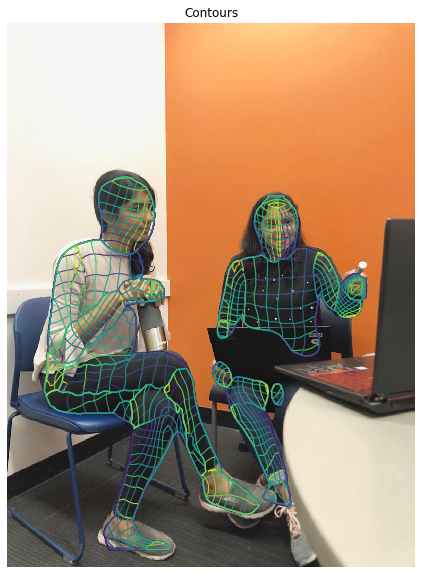

In [ ]:
IUV = cv2.imread(join(project_name, 'DensePoseData/infer_out/testimage_IUV.png'))
INDS = cv2.imread(join(project_name, 'DensePoseData/infer_out/testimage_INDS.png'),  0)

fig = plt.figure(figsize=[10,10])
plt.imshow( im[:,:,::-1] )
plt.contour( IUV[:,:,1]/256.,10, linewidths = 1 )
plt.contour( IUV[:,:,2]/256.,10, linewidths = 1 )
plt.axis('off') ; 
plt.title('Contours')
plt.show()

Visualize the human-body FG mask indices:

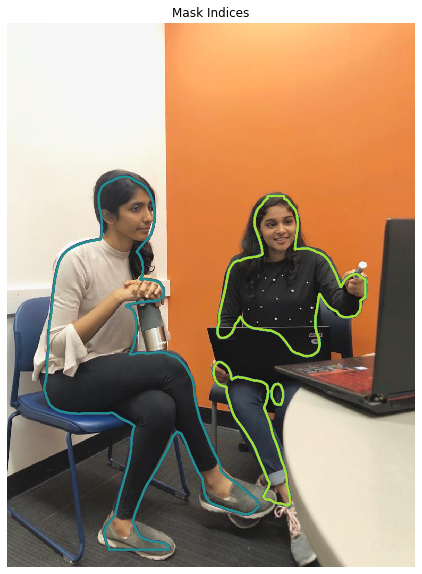

In [ ]:
fig = plt.figure(figsize=[10,10])
plt.imshow( im[:,:,::-1] )
plt.contour( INDS, linewidths = 2 )
plt.axis('off') ; 
plt.title('Mask Indices')
plt.show()

# **Texture Transfer Using Estimated Dense Coordinates on our test image**


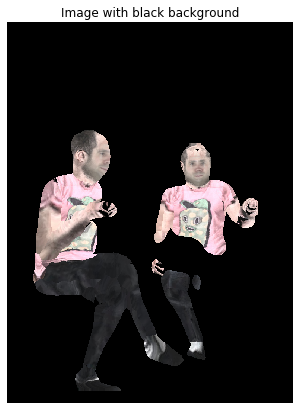

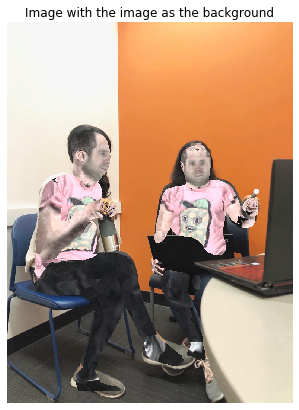

In [ ]:
IUV = cv2.imread(join(project_name,'DensePoseData/infer_out/testimage_IUV.png'))
im  = cv2.imread(join(project_name,'DensePoseData/demo_data/testimage.jpeg'))
#######
## Visualize the image with black background
image = TransferTexture(TextureIm,np.zeros(IUV.shape),IUV)
fig = plt.figure(figsize=[7,7])
plt.imshow(image[:,:,::-1]); plt.axis('off'); 
plt.title('Image with black background')
plt.show()
#######
## Visualize the image with the image as the background.
image = TransferTexture(TextureIm,im,IUV)
fig = plt.figure(figsize=[7,7])
plt.imshow(image[:,:,::-1]); plt.axis('off'); 
plt.title('Image with the image as the background')
plt.show()

# **DensePose on Video**

Detecting poses of multiple people in a video.

Upload:

'testvideo.mp4' in the folder DensePoseData/demo_data

'infer_vid.py' in the folder DensePose/tools

'visnew.py' in the folder DensePose/detectron/utils

In [ ]:
!cd $project_name && python2 tools/infer_vid.py \
     --cfg configs/DensePose_ResNet101_FPN_s1x-e2e.yaml \
     --output-dir DensePoseData/infer_out/ \
     --wts https://s3.amazonaws.com/densepose/DensePose_ResNet101_FPN_s1x-e2e.pkl \
     --input-file DensePoseData/demo_data/testvideo.mp4

Found Detectron ops lib: /content/anaconda2/lib/python2.7/site-packages/lib/libcaffe2_detectron_ops_gpu.so
[E init_intrinsics_check.cc:43] CPU feature avx is present on your machine, but the Caffe2 binary is not compiled with it. It means you may not get the full speed of your CPU.
[E init_intrinsics_check.cc:43] CPU feature avx2 is present on your machine, but the Caffe2 binary is not compiled with it. It means you may not get the full speed of your CPU.
[E init_intrinsics_check.cc:43] CPU feature fma is present on your machine, but the Caffe2 binary is not compiled with it. It means you may not get the full speed of your CPU.
WARNING cnn.py:  25: [====DEPRECATE WARNING====]: you are creating an object from CNNModelHelper class which will be deprecated soon. Please use ModelHelper object with brew module. For more information, please refer to caffe2.ai and python/brew.py, python/brew_test.py for more information.
INFO net.py:  51: Loading weights from: /tmp/detectron-download-cache/De

In [ ]:
import io
import base64
from IPython.display import HTML

video = io.open('DensePose/DensePoseData/infer_out/vid/out.mp4', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))